# Image colorization with a pre-trained UNet using GANs


Implementation of the Image-to-Image Translation using a pretrained ResNet on UNet Generator followed by colorization in a supervised manner using L1 loss.

# Loss Functions


<h3> Conditional GAN Loss </h3>
<div>
<img src="https://miro.medium.com/max/1400/1*_e3VcDdd7x7-RGG4BoNZ0A.webp" width="600px"align="center">
    </div><br>

<h3> L1 Loss </h3>
<div>
<img src="https://miro.medium.com/max/1400/1*S9vJ_R-Jn3sL0C09DjtL4w.webp" width="500px"align="center">
    </div><br>



* x -> grayscale image *(the condition introduced)*
* y -> 2 channel output of generator
* z -> input noise of generator
* G -> Generator Model
* D -> Discriminator Model

Using the above 2, the final function we have to optimize is as follows
<div>
<img src="https://miro.medium.com/max/1400/1*e0nyJD1hTm5OoKDrU_F6bw.webp" width="600px"align="center">
    </div><br>

Thus the objective functions job is to maximize the discriminator loss i.e maximize the probability of discerning fake vs real images and simultaneously minimize the generator's loss i.e the difference between the generated image and the ground truth image should be minimum. This tests the discriminator whether it can identify a fake vs a real image. We maximize the discriminator loss because we want it to be able to always make correct predictions of fake vs real. This ensures that Generator does a good job in trying to fool the Discriminator. We keep playing this game between the generator vs the discriminator in tandem till they can solve this problem together.

#Why L1 loss?
1. L1 loss tends to produce results that are less prone to artifacts and more visually appealing compared to L2 loss, especially in tasks like image generation or super-resolution. The reason is that L1 loss penalizes the absolute differences between the predicted and target values, making it less sensitive to outliers than L2 loss, which penalizes the squared differences

2. Experimentally, when utilizing L1 loss alone for image colorization the model tends to produce colored images but often adopts conservative color choices such as "gray" or "brown." This behavior arises when the model - uncertain about the optimal color - defaults to averaging colors to minimize the L1 loss.


## Difference between GAN and Conditional GAN

1. **Objective:**
   - *GAN (Generative Adversarial Network):* A standard GAN is designed to generate realistic data samples, such as images, without any specific control over the content of the generated samples.
   - *cGAN (Conditional Generative Adversarial Network):* A cGAN, on the other hand, is conditioned on additional information during the training process. This additional information, often represented as labels or some other form of auxiliary input, allows the user to influence and control the characteristics of the generated samples.

2. **Architecture:**
   - *GAN:* A typical GAN consists of a generator and a discriminator. The generator tries to create realistic samples, and the discriminator aims to distinguish between real and generated samples.
   - *cGAN:* A cGAN has the same basic architecture as a GAN, but with an additional input, often referred to as the conditioning variable or label. This conditioning input is given to both the generator and discriminator, allowing the user to guide the generation process.

3. **Training Process:**
   - *GAN:* In a GAN, the generator learns to create samples that are indistinguishable from real ones, and the discriminator learns to get better at distinguishing between real and generated samples.
   - *cGAN:* The conditioning information in a cGAN allows for more targeted generation. For example, if the conditioning input is a specific class label, the generator can learn to generate samples belonging to that particular class.




<br>
<div>
<img src="https://miro.medium.com/max/1248/1*uaOVmoDEQ23Ceoz1swyBhw.webp" width="300px"align="center">
    </div>
    <br>

## Code

## 1 - Headers, configurations, dataset


We will use around 10,000 images from COCO dataset for our implementation.

Training - 8000 images
Testing - 2000 images

In [14]:
class Config:
    external_data_size = 10000
    train_size = 8000
    image_size_1 = 256
    image_size_2 = 256
    batch_size = 32
    LeakyReLU_slope = 0.2
    dropout = 0.5
    kernel_size = 4
    stride = 2
    padding = 1
    gen_lr = 2e-4
    disc_lr = 2e-4
    beta1 = 0.5
    beta2 = 0.999
    lambda_l1 = 100
    gan_mode = 'vanilla'
    layers_to_cut = -2
    epochs = 5
    pretrain_lr = 1e-4

In [15]:
import os
import glob
import time
import numpy as np
from PIL import Image
from pathlib import Path
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb
Path.ls = lambda x: list(x.iterdir())

import PIL
from PIL import Image

import torch
from torch import nn, optim
from torch import nn, optim
from torchvision import transforms
from torchvision.models.resnet import resnet18
from torchvision.models.vgg import vgg19
from torch.utils.data import Dataset, DataLoader
from torchvision.utils import make_grid
from torch.hub import load_state_dict_from_url

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [16]:
!pip install fastai==2.4 #For downloading COCO dataset

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 187.9/187.9 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.0/56.0 kB 7.9 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of fastai to determine which version is compatible with other requirements. This could take a while.
ERROR: Could not find a version that satisfies the requirement torch<1.10,>=1.7.0 (from fastai) (from versions: 1.11.0, 1.12.0, 1.12.1, 1.13.0, 1.13.1, 2.0.0, 2.0.1, 2.1.0, 2.1.1, 2.1.2)
ERROR: No matching distribution found for torch<1.10,>=1.7.0


In [17]:
try:
    from torch.hub import load_state_dict_from_url
except ImportError:
    from torch.utils.model_zoo import load_url as load_state_dict_from_url

In [18]:
!pip install torch torchvision==0.7.0

ERROR: Could not find a version that satisfies the requirement torchvision==0.7.0 (from versions: 0.1.6, 0.1.7, 0.1.8, 0.1.9, 0.2.0, 0.2.1, 0.2.2, 0.2.2.post2, 0.2.2.post3, 0.12.0, 0.13.0, 0.13.1, 0.14.0, 0.14.1, 0.15.0, 0.15.1, 0.15.2, 0.16.0, 0.16.1, 0.16.2)
ERROR: No matching distribution found for torchvision==0.7.0


In [19]:
!pip3 install Cython

In [20]:
from fastai.vision.learner import create_body
from fastai.vision.models.unet import DynamicUnet

In [21]:
from fastai.data.external import untar_data, URLs
coco_path = untar_data(URLs.COCO_SAMPLE)
coco_path = str(coco_path) + "/train_sample"
use_colab = True

We randonly choose 10,000 images from and do an 80-20 split

In [22]:
if use_colab == True:
    path = coco_path
else:
    path = "Your path to the dataset"

paths = glob.glob(path + "/*.jpg") # Grabbing all the image file names
np.random.seed(123)
paths_subset = np.random.choice(paths, 10_000, replace=False) # choosing 10000 images randomly
rand_idxs = np.random.permutation(10_000)
train_idxs = rand_idxs[:8000] # choosing the first 8000 as training set
val_idxs = rand_idxs[8000:] # choosing last 2000 as validation set
train_paths = paths_subset[train_idxs]
val_paths = paths_subset[val_idxs]
print(len(train_paths), len(val_paths))

8000 2000


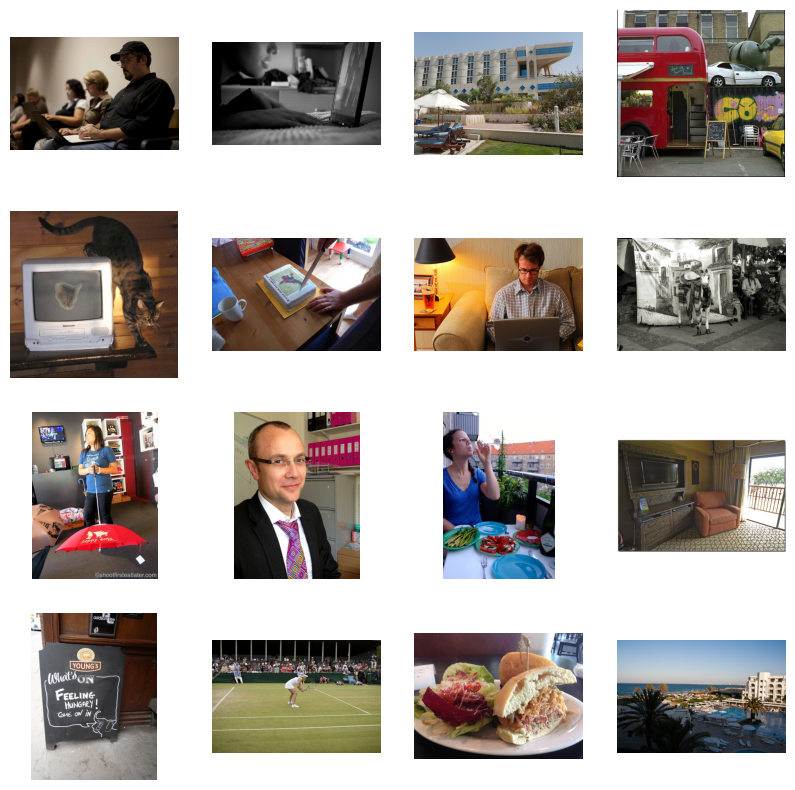

In [23]:
_, axes = plt.subplots(4, 4, figsize=(10, 10))
for ax, img_path in zip(axes.flatten(), train_paths):
    ax.imshow(Image.open(img_path))
    ax.axis("off")

## 1.1 - Making Datasets and DataLoaders


1. We inherit from the Dataset module in PyTorch and create a custom colorization class.

2. We apply some simple data augmentation such as resizing and random horizontal flipping

3. We convert the RGB image to LAB space and separate the L channel(grayscale) againsthe AB space. These will be the inputs(L) and targets(AB) for the model respectively.

In [24]:
SIZE = 256
class ColorizationDataset(Dataset):
    def __init__(self, paths, split='train'):
        if split == 'train':
            self.transforms = transforms.Compose([
                transforms.Resize((SIZE, SIZE),  Image.Resampling.BICUBIC),
                transforms.RandomHorizontalFlip(), # A little data augmentation!
            ])
        elif split == 'val':
            self.transforms = transforms.Resize((SIZE, SIZE),  Image.Resampling.BICUBIC)

        self.split = split
        self.size = SIZE
        self.paths = paths

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        img = self.transforms(img)
        img = np.array(img)
        img_lab = rgb2lab(img).astype("float32") # Converting RGB to L*a*b
        img_lab = transforms.ToTensor()(img_lab)
        L = img_lab[[0], ...] / 50. - 1. # Between -1 and 1
        ab = img_lab[[1, 2], ...] / 110. # Between -1 and 1

        return {'L': L, 'ab': ab}

    def __len__(self):
        return len(self.paths)

In [25]:
def make_dataloaders(batch_size=16,
                     n_workers=2,
                     pin_memory=True,
                     **kwargs): # A handy function to make our dataloaders
    dataset = ColorizationDataset(**kwargs)
    dataloader = DataLoader(dataset,
                            batch_size=batch_size,
                            num_workers=n_workers,
                            pin_memory=pin_memory)
    return dataloader

In [26]:
train_dl = make_dataloaders(paths=train_paths, split='train')
val_dl = make_dataloaders(paths=val_paths, split='val')

data = next(iter(train_dl))
Ls, abs_ = data['L'], data['ab']
print(Ls.shape, abs_.shape)
print(len(train_dl), len(val_dl))

torch.Size([16, 1, 256, 256]) torch.Size([16, 2, 256, 256])
500 125


## Generator

We are going 8 layers down, so if we start with a 256 by 256 image, in the middle of the U-Net we will get a 1 by 1 (256 / 2⁸) image and then it gets up-sampled to produce a 256 by 256 image (with two channels).

In [27]:
class UnetBlock(nn.Module):
    def __init__(self, nf, ni, submodule=None, input_c=None, dropout=False,
                 innermost=False, outermost=False):
        """
        U-Net Block Class.

        Parameters:
        - nf (int): Number of filters.
        - ni (int): Number of input channels.
        - submodule (UnetBlock): Submodule (inner block) of the U-Net block.
        - input_c (int, optional): Number of input channels (default is None, which is set to nf).
        - dropout (bool, optional): Whether to include dropout.
        - innermost (bool, optional): Whether the block is the innermost block.
        - outermost (bool, optional): Whether the block is the outermost block.
        """
        super().__init__()
        self.outermost = outermost
        if input_c is None:
            input_c = nf
        downconv = nn.Conv2d(input_c, ni, kernel_size=4,
                             stride=2, padding=1, bias=False)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = nn.BatchNorm2d(ni)
        uprelu = nn.ReLU(True)
        upnorm = nn.BatchNorm2d(nf)

        if outermost:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1)
            down = [downconv]
            up = [uprelu, upconv, nn.Tanh()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(ni, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]
            if dropout:
                up += [nn.Dropout(0.5)]
            model = down + [submodule] + up
        self.model = nn.Sequential(*model)

    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

class Unet(nn.Module):
    def __init__(self, input_c=1, output_c=2, n_down=8, num_filters=64):
        """
        U-Net Model Class.

        Parameters:
        - input_c (int, optional): Number of input channels (default is 1).
        - output_c (int, optional): Number of output channels (default is 2).
        - n_down (int, optional): Number of down-sampling blocks.
        - num_filters (int, optional): Number of filters.
        """
        super().__init__()
        unet_block = UnetBlock(num_filters * 8, num_filters * 8, innermost=True)
        for _ in range(n_down - 5):
            unet_block = UnetBlock(num_filters * 8, num_filters * 8, submodule=unet_block, dropout=True)
        out_filters = num_filters * 8
        for _ in range(3):
            unet_block = UnetBlock(out_filters // 2, out_filters, submodule=unet_block)
            out_filters //= 2
        self.model = UnetBlock(output_c, out_filters, input_c=input_c, submodule=unet_block, outermost=True)

    def forward(self, x):
        return self.model(x)


In [28]:
#@title Hide
# class UnetBlock(nn.Module):
#     def __init__(self, nf, ni, submodule=None, input_c=None, dropout=False,
#                  innermost=False, outermost=False):
#         super().__init__()
#         self.outermost = outermost
#         if input_c is None: input_c = nf
#         downconv = nn.Conv2d(input_c, ni, kernel_size=4,
#                              stride=2, padding=1, bias=False)
#         downrelu = nn.LeakyReLU(0.2, True)
#         downnorm = nn.BatchNorm2d(ni)
#         uprelu = nn.ReLU(True)
#         upnorm = nn.BatchNorm2d(nf)

#         if outermost:
#             upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
#                                         stride=2, padding=1)
#             down = [downconv]
#             up = [uprelu, upconv, nn.Tanh()]
#             model = down + [submodule] + up
#         elif innermost:
#             upconv = nn.ConvTranspose2d(ni, nf, kernel_size=4,
#                                         stride=2, padding=1, bias=False)
#             down = [downrelu, downconv]
#             up = [uprelu, upconv, upnorm]
#             model = down + up
#         else:
#             upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
#                                         stride=2, padding=1, bias=False)
#             down = [downrelu, downconv, downnorm]
#             up = [uprelu, upconv, upnorm]
#             if dropout: up += [nn.Dropout(0.5)]
#             model = down + [submodule] + up
#         self.model = nn.Sequential(*model)

#     def forward(self, x):
#         if self.outermost:
#             return self.model(x)
#         else:
#             return torch.cat([x, self.model(x)], 1)

# class Unet(nn.Module):
#     def __init__(self, input_c=1, output_c=2, n_down=8, num_filters=64):
#         super().__init__()
#         unet_block = UnetBlock(num_filters * 8, num_filters * 8, innermost=True)
#         for _ in range(n_down - 5):
#             unet_block = UnetBlock(num_filters * 8, num_filters * 8, submodule=unet_block, dropout=True)
#         out_filters = num_filters * 8
#         for _ in range(3):
#             unet_block = UnetBlock(out_filters // 2, out_filters, submodule=unet_block)
#             out_filters //= 2
#         self.model = UnetBlock(output_c, out_filters, input_c=input_c, submodule=unet_block, outermost=True)

#     def forward(self, x):
#         return self.model(x)

## Discriminator

Stacking blocks of Conv-BatchNorm-LeakyReLU to discern whether the input image is fake or real

Vanilla Discriminator:
- Outputs a single scalar value indicating the likelihood that the entire input image is real or fake.
- Evaluates the global structure and realism of the entire image.

Patch Discriminator (PatchGAN):
- Outputs a grid of scalar values, each corresponding to a specific patch in the input image. Each scalar value in the grid expresses the probability of that subsection of the image(patch) being real or fake
- Decides the realism of local patches independently, allowing for finer-grained analysis.
- Particularly useful for tasks where local changes are crucial, such as image-to-image translation.

- In the context of the Patch Discriminator, the receptive field determines the effective size of the patches being evaluated.
For example, if the output shape is 30x30 - this means that once we find the receptive field of each of these 900 values, we will get the patch size it has come from(70 x 70)

In [29]:
class PatchDiscriminator(nn.Module):
    def __init__(self, input_c, num_filters=64, n_down=3):
        super().__init__()
        model = [self.get_layers(input_c, num_filters, norm=False)]
        model += [self.get_layers(num_filters * 2 ** i, num_filters * 2 ** (i + 1), s=1 if i == (n_down-1) else 2)
                          for i in range(n_down)] # the 'if' statement is taking care of not using
                                                  # stride of 2 for the last block in this loop
        model += [self.get_layers(num_filters * 2 ** n_down, 1, s=1, norm=False, act=False)] # Make sure to not use normalization or
                                                                                             # activation for the last layer of the model
        self.model = nn.Sequential(*model)

    def get_layers(self, ni, nf, k=4, s=2, p=1, norm=True, act=True): # when needing to make some repeatitive blocks of layers,
        layers = [nn.Conv2d(ni, nf, k, s, p, bias=not norm)]          # it's always helpful to make a separate method for that purpose
        if norm: layers += [nn.BatchNorm2d(nf)]
        if act: layers += [nn.LeakyReLU(0.2, True)]
        return nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

In [30]:
discriminator = PatchDiscriminator(3)
dummy_input = torch.randn(16, 3, 256, 256) # batch_size, channels, size, size
out = discriminator(dummy_input)
out.shape

torch.Size([16, 1, 30, 30])

## GAN Loss



In [31]:
class GANLoss(nn.Module):
    def __init__(self, gan_mode='vanilla', real_label=1.0, fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
        if gan_mode == 'vanilla':
            self.loss = nn.BCEWithLogitsLoss()
        elif gan_mode == 'lsgan':
            self.loss = nn.MSELoss()

    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)

    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

## Weight Initialization

Mean - 0 and std dev 0.02 according to article referred below


In [32]:
def init_weights(net, init='norm', gain=0.02):

    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            if init == 'norm':
                nn.init.normal_(m.weight.data, mean=0.0, std=gain)
            elif init == 'xavier':
                nn.init.xavier_normal_(m.weight.data, gain=gain)
            elif init == 'kaiming':
                nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')

            if hasattr(m, 'bias') and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., gain)
            nn.init.constant_(m.bias.data, 0.)

    net.apply(init_func)
    print(f"model initialized with {init} initialization")
    return net

def init_model(model, device):
    model = model.to(device)
    model = init_weights(model)
    return model


## MainModel Class Overview

- The `MainModel` class is defined as a subclass of `nn.Module`.

### Constructor (__init__)

- Initializes the model with hyperparameters.
- Initializes the generator (`net_G`), discriminator (`net_D`).
- Sets up loss functions (`GANcriterion` and `L1criterion`) and optimizers (`opt_G` and `opt_D`).

### `set_requires_grad` Method

- Sets the `requires_grad` attribute for the parameters of a given model.

### `setup_input` Method

- Sets up input data, including luminance (`L`) and color channels (`ab`).

### `forward` Method

- Performs a forward pass through the generator.

### `backward_D` Method

- Computes and backpropagates the discriminator loss.

### `backward_G` Method

- Computes and backpropagates the generator loss.

### `optimize` Method

- Performs optimization steps for both the discriminator and generator.


In [33]:
class MainModel(nn.Module):
    def __init__(self, net_G=None, lr_G=2e-4, lr_D=2e-4,
                 beta1=0.5, beta2=0.999, lambda_L1=100.):
        super().__init__()

        # 1. Initialize the device based on GPU availability
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        # 2. Set hyperparameters and initialize the generator network
        self.lambda_L1 = lambda_L1
        if net_G is None:
            self.net_G = init_model(Unet(input_c=1, output_c=2, n_down=8, num_filters=64), self.device)
        else:
            self.net_G = net_G.to(self.device)

        # 3. Initialize the discriminator network
        self.net_D = init_model(PatchDiscriminator(input_c=3, n_down=3, num_filters=64), self.device)

        # 4. Initialize GAN loss criterion and L1 loss criterion
        self.GANcriterion = GANLoss(gan_mode='vanilla').to(self.device)
        self.L1criterion = nn.L1Loss()

        # 5. Initialize optimizers for the generator and discriminator
        self.opt_G = optim.Adam(self.net_G.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.opt_D = optim.Adam(self.net_D.parameters(), lr=lr_D, betas=(beta1, beta2))

    def set_requires_grad(self, model, requires_grad=True):
        # 6. Set the requires_grad attribute for model parameters
        for p in model.parameters():
            p.requires_grad = requires_grad

    def setup_input(self, data):
        # 7. Set up input data (L: luminance, ab: color channels)
        self.L = data['L'].to(self.device)
        self.ab = data['ab'].to(self.device)

    def forward(self):
        # 8. Perform a forward pass through the generator
        self.fake_color = self.net_G(self.L)

    def backward_D(self):
        # 9. Compute and backpropagate the discriminator loss

        # We feed the generated fake images and label them as real and feed batch of real images from training data and label them as fake.
        # We add up the 2 losses and call backward on the final loss
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image.detach())
        self.loss_D_fake = self.GANcriterion(fake_preds, False)
        real_image = torch.cat([self.L, self.ab], dim=1)
        real_preds = self.net_D(real_image)
        self.loss_D_real = self.GANcriterion(real_preds, True)
        self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5
        self.loss_D.backward()

    def backward_G(self):
        # 10. Compute and backpropagate the generator loss

        # We feed the discriminator the fake image and try to fool it by assigning real labels to them and calculating the adversarial loss
        # we use L1 loss as well and compute the distance between the predicted two channels and the target two channels and multiply
        # this loss by a coefficient (which is 100 in our case) to balance the two losses and then add this loss to the adversarial loss

        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image)
        self.loss_G_GAN = self.GANcriterion(fake_preds, True)
        self.loss_G_L1 = self.L1criterion(self.fake_color, self.ab) * self.lambda_L1
        self.loss_G = self.loss_G_GAN + self.loss_G_L1
        self.loss_G.backward()

    def optimize(self):
        # 11. Perform optimization steps for both the discriminator and generator
        self.forward()
        self.net_D.train()
        self.set_requires_grad(self.net_D, True)
        self.opt_D.zero_grad()
        self.backward_D()
        self.opt_D.step()

        self.net_G.train()
        self.set_requires_grad(self.net_D, False)
        self.opt_G.zero_grad()
        self.backward_G()
        self.opt_G.step()


In [34]:
#@title Hide this
# class MainModel(nn.Module):
#     def __init__(self, net_G=None, lr_G=2e-4, lr_D=2e-4,
#                  beta1=0.5, beta2=0.999, lambda_L1=100.):
#         super().__init__()

#         self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#         self.lambda_L1 = lambda_L1

#         if net_G is None:
#             self.net_G = init_model(Unet(input_c=1, output_c=2, n_down=8, num_filters=64), self.device)
#         else:
#             self.net_G = net_G.to(self.device)
#         self.net_D = init_model(PatchDiscriminator(input_c=3, n_down=3, num_filters=64), self.device)
#         self.GANcriterion = GANLoss(gan_mode='vanilla').to(self.device)
#         self.L1criterion = nn.L1Loss()
#         self.opt_G = optim.Adam(self.net_G.parameters(), lr=lr_G, betas=(beta1, beta2))
#         self.opt_D = optim.Adam(self.net_D.parameters(), lr=lr_D, betas=(beta1, beta2))

#     def set_requires_grad(self, model, requires_grad=True):
#         for p in model.parameters():
#             p.requires_grad = requires_grad

#     def setup_input(self, data):
#         self.L = data['L'].to(self.device)
#         self.ab = data['ab'].to(self.device)

#     def forward(self):
#         self.fake_color = self.net_G(self.L)

#     def backward_D(self):
#         fake_image = torch.cat([self.L, self.fake_color], dim=1)
#         fake_preds = self.net_D(fake_image.detach())
#         self.loss_D_fake = self.GANcriterion(fake_preds, False)
#         real_image = torch.cat([self.L, self.ab], dim=1)
#         real_preds = self.net_D(real_image)
#         self.loss_D_real = self.GANcriterion(real_preds, True)
#         self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5
#         self.loss_D.backward()

#     def backward_G(self):
#         fake_image = torch.cat([self.L, self.fake_color], dim=1)
#         fake_preds = self.net_D(fake_image)
#         self.loss_G_GAN = self.GANcriterion(fake_preds, True)
#         self.loss_G_L1 = self.L1criterion(self.fake_color, self.ab) * self.lambda_L1
#         self.loss_G = self.loss_G_GAN + self.loss_G_L1
#         self.loss_G.backward()

#     def optimize(self):
#         self.forward()
#         self.net_D.train()
#         self.set_requires_grad(self.net_D, True)
#         self.opt_D.zero_grad()
#         self.backward_D()
#         self.opt_D.step()

#         self.net_G.train()
#         self.set_requires_grad(self.net_D, False)
#         self.opt_G.zero_grad()
#         self.backward_G()
#         self.opt_G.step()

### Utility Functions

In [35]:
class AverageMeter:
    def __init__(self):
        self.reset()

    def reset(self):
        self.count, self.avg, self.sum = [0.] * 3

    def update(self, val, count=1):
        self.count += count
        self.sum += count * val
        self.avg = self.sum / self.count

def create_loss_meters():
    loss_D_fake = AverageMeter()
    loss_D_real = AverageMeter()
    loss_D = AverageMeter()
    loss_G_GAN = AverageMeter()
    loss_G_L1 = AverageMeter()
    loss_G = AverageMeter()

    return {'loss_D_fake': loss_D_fake,
            'loss_D_real': loss_D_real,
            'loss_D': loss_D,
            'loss_G_GAN': loss_G_GAN,
            'loss_G_L1': loss_G_L1,
            'loss_G': loss_G}

def update_losses(model, loss_meter_dict, count):
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)
        loss_meter.update(loss.item(), count=count)

def lab_to_rgb(L, ab):
    """
    Takes a batch of images
    """
    L = (L + 1.) * 50.
    ab = ab * 110.
    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()
    rgb_imgs = []
    for img in Lab:
        img_rgb = lab2rgb(img)
        rgb_imgs.append(img_rgb)
    return np.stack(rgb_imgs, axis=0)

def visualize(model, data, save=True):
    model.net_G.eval()
    with torch.no_grad():
        model.setup_input(data)
        model.forward()
    model.net_G.train()
    fake_color = model.fake_color.detach()
    real_color = model.ab
    L = model.L
    fake_imgs = lab_to_rgb(L, fake_color)
    real_imgs = lab_to_rgb(L, real_color)
    fig = plt.figure(figsize=(15, 8))
    for i in range(5):
        ax = plt.subplot(3, 5, i + 1)
        ax.imshow(L[i][0].cpu(), cmap='gray')
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 5)
        ax.imshow(fake_imgs[i])
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 10)
        ax.imshow(real_imgs[i])
        ax.axis("off")
    plt.show()
    if save:
        fig.savefig(f"colorization_{time.time()}.png")

def log_results(loss_meter_dict):
    for loss_name, loss_meter in loss_meter_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")

## Pre-trained UNet backbone

using fastai to get the pre-trained architecture

In [36]:
def build_backbone_unet(input_channels=1, output_channels=2, size=Config.image_size_1):
    """Function that helps build the generator backbone using another pretrained model trained on imagenet for image classification"""
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    body = create_body(resnet18(), pretrained=True, n_in=input_channels, cut=Config.layers_to_cut)
    generator = DynamicUnet(body, output_channels, (size, size)).to(device)
    return generator

def pretrain_generator(generator, train_dl, opt, criterion, epochs):
    """

    Function to pretrain the generator in a supervised manner on the colorization task using L1 Loss.

    """

    for e in range(epochs):
        loss_meter = AverageMeter()
        for data in tqdm(train_dl):
            L, ab = data['L'].to(device), data['ab'].to(device)
            preds = generator(L)
            loss = criterion(preds, ab)
            opt.zero_grad()
            loss.backward()
            opt.step()

            loss_meter.update(loss.item(), L.size(0))

        print(f"Epoch {e + 1}/{epochs}")
        print(f"L1 Loss: {loss_meter.avg:.5f}")

## Model Training

In [37]:
def train_model(model, train_dl, epochs, display_every=200):
    data = next(iter(val_dl)) # getting a batch for visualizing the model output after fixed intrvals
    for e in range(epochs):
        loss_meter_dict = create_loss_meters() # function returing a dictionary of objects to
        i = 0                                  # log the losses of the complete network
        for data in tqdm(train_dl):
            model.setup_input(data)
            model.optimize()
            update_losses(model, loss_meter_dict, count=data['L'].size(0)) # function updating the log objects
            i += 1
            if i % display_every == 0:
                print(f"\nEpoch {e+1}/{epochs}")
                print(f"Iteration {i}/{len(train_dl)}")
                log_results(loss_meter_dict) # function to print out the losses
                visualize(model, data, save=False) # function displaying the model's outputs

  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 1/5
L1 Loss: 0.08668


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 2/5
L1 Loss: 0.08337


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 3/5
L1 Loss: 0.08287


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 4/5
L1 Loss: 0.08258


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 5/5
L1 Loss: 0.08241
model initialized with norm initialization


  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 1/5
Iteration 200/500
loss_D_fake: 0.51302
loss_D_real: 0.53705
loss_D: 0.52503
loss_G_GAN: 1.37796
loss_G_L1: 8.77772
loss_G: 10.15567


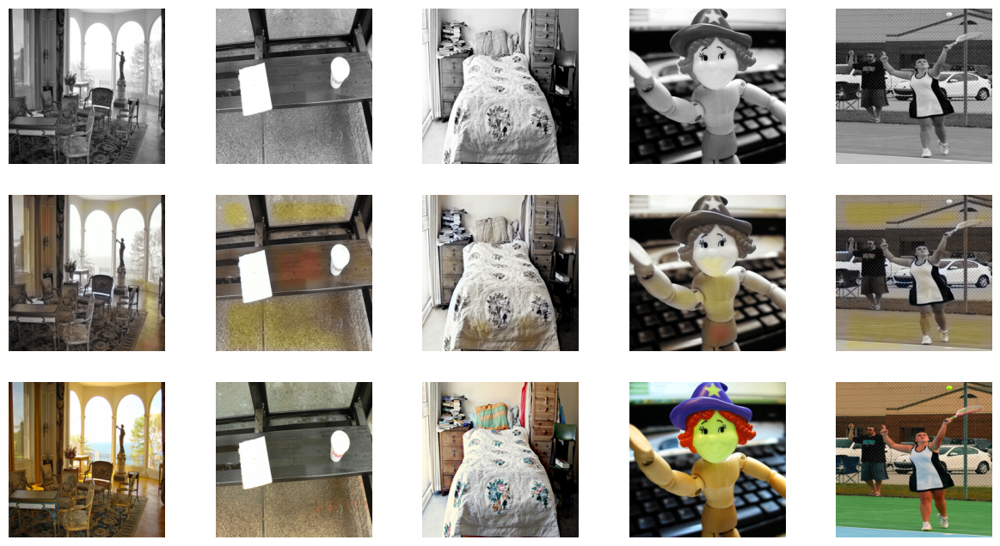


Epoch 1/5
Iteration 400/500
loss_D_fake: 0.46883
loss_D_real: 0.47905
loss_D: 0.47394
loss_G_GAN: 1.58236
loss_G_L1: 9.23490
loss_G: 10.81725


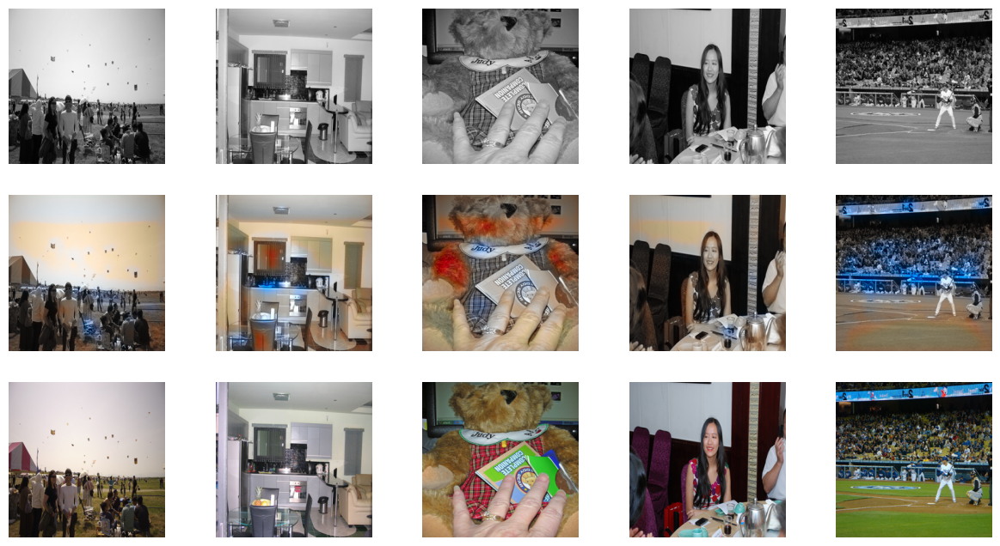

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 2/5
Iteration 200/500
loss_D_fake: 0.46673
loss_D_real: 0.47780
loss_D: 0.47227
loss_G_GAN: 1.69569
loss_G_L1: 10.44014
loss_G: 12.13582


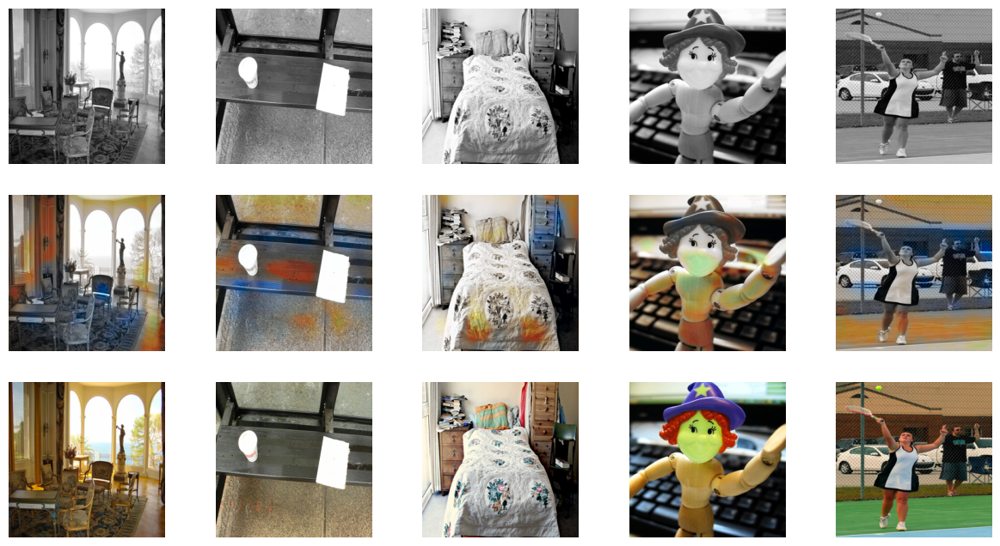


Epoch 2/5
Iteration 400/500
loss_D_fake: 0.47478
loss_D_real: 0.49068
loss_D: 0.48273
loss_G_GAN: 1.61470
loss_G_L1: 10.58184
loss_G: 12.19654


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 30 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 40 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 8 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 10 pixels
  return func(*args, **kwargs)


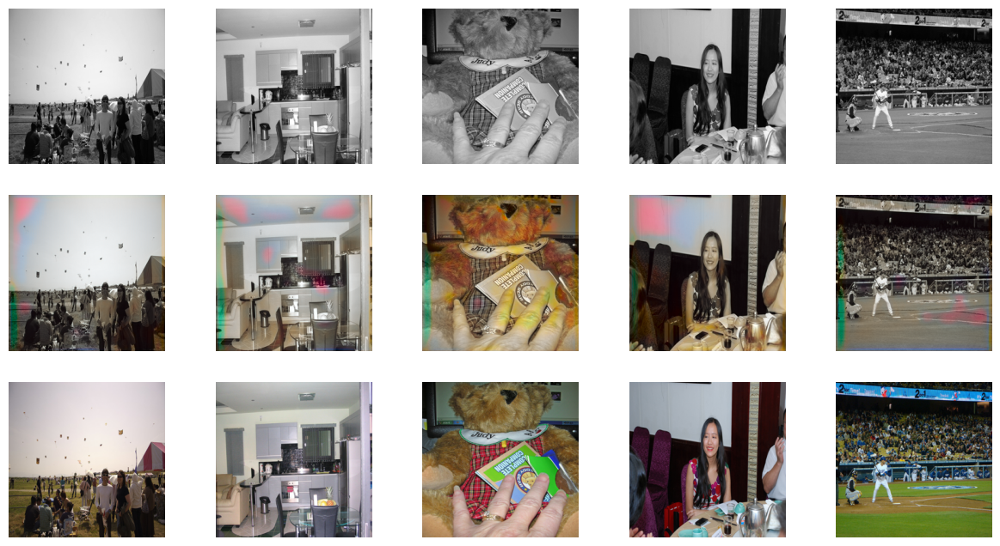

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 3/5
Iteration 200/500
loss_D_fake: 0.49433
loss_D_real: 0.51676
loss_D: 0.50555
loss_G_GAN: 1.55495
loss_G_L1: 10.64988
loss_G: 12.20483


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 22 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 98 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 18 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 25 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 6 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 109 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_sha

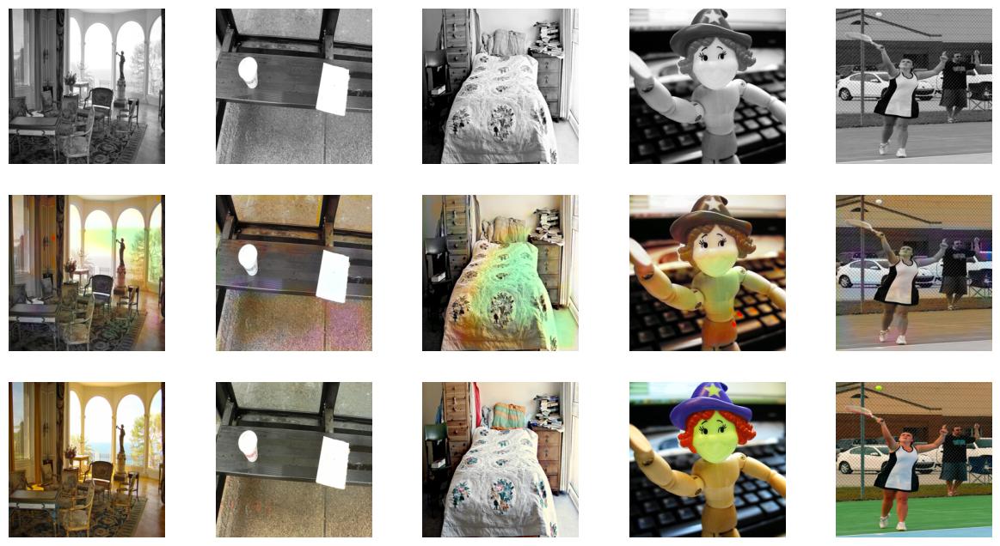


Epoch 3/5
Iteration 400/500
loss_D_fake: 0.49774
loss_D_real: 0.53359
loss_D: 0.51566
loss_G_GAN: 1.45327
loss_G_L1: 10.67356
loss_G: 12.12683


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 107 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 133 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 38 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 34 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 2 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 14 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_sh

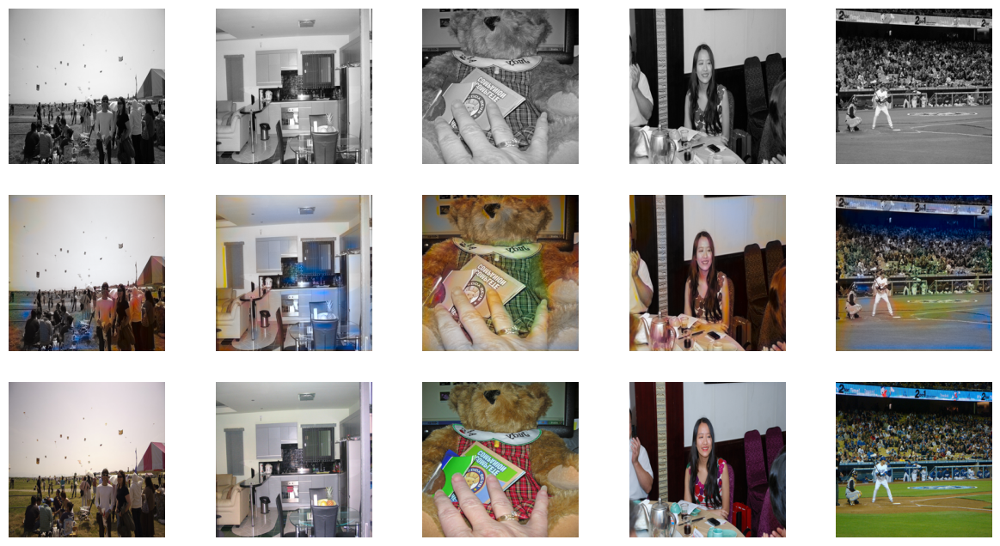

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 4/5
Iteration 200/500
loss_D_fake: 0.51043
loss_D_real: 0.55197
loss_D: 0.53120
loss_G_GAN: 1.42033
loss_G_L1: 10.65007
loss_G: 12.07040


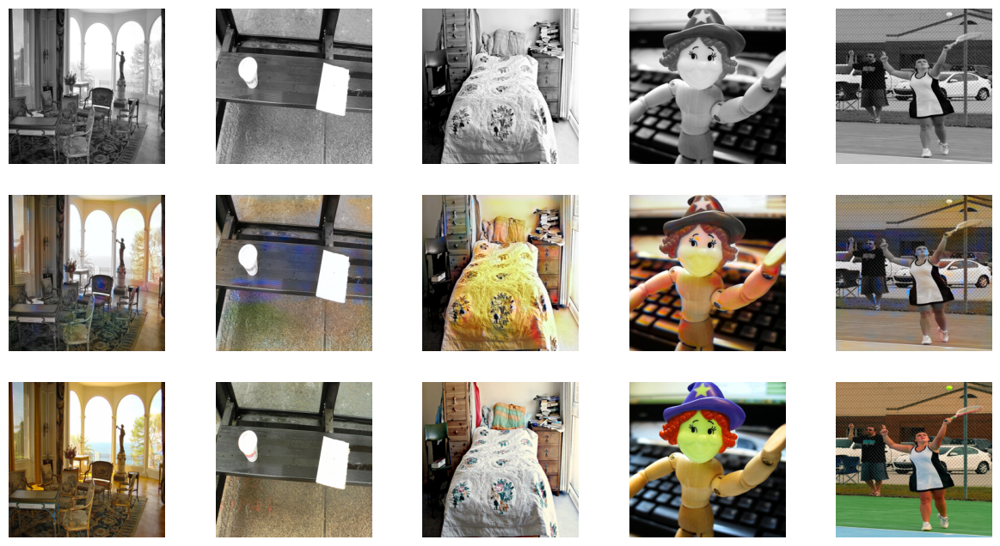


Epoch 4/5
Iteration 400/500
loss_D_fake: 0.52057
loss_D_real: 0.57092
loss_D: 0.54575
loss_G_GAN: 1.35649
loss_G_L1: 10.69494
loss_G: 12.05143


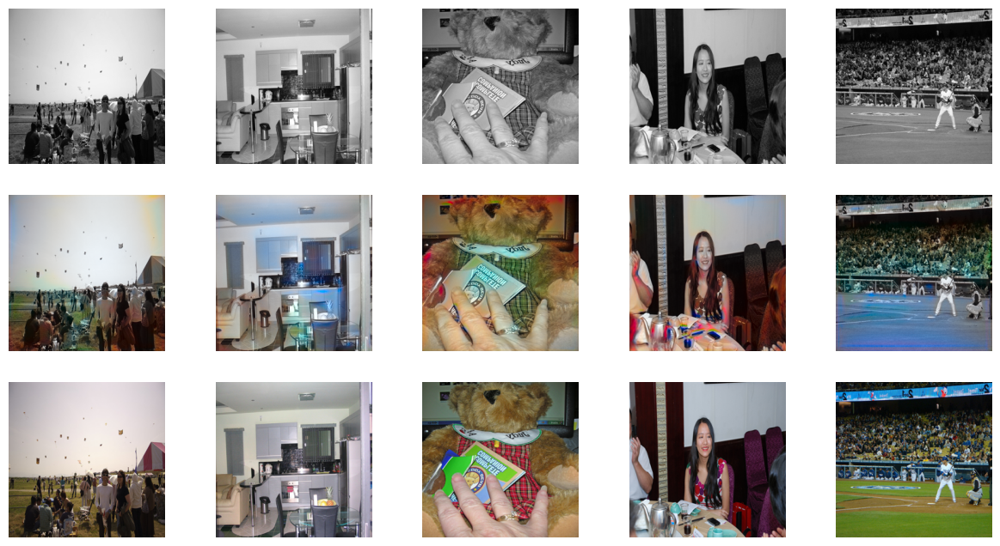

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 5/5
Iteration 200/500
loss_D_fake: 0.53703
loss_D_real: 0.58229
loss_D: 0.55966
loss_G_GAN: 1.26900
loss_G_L1: 10.76249
loss_G: 12.03149


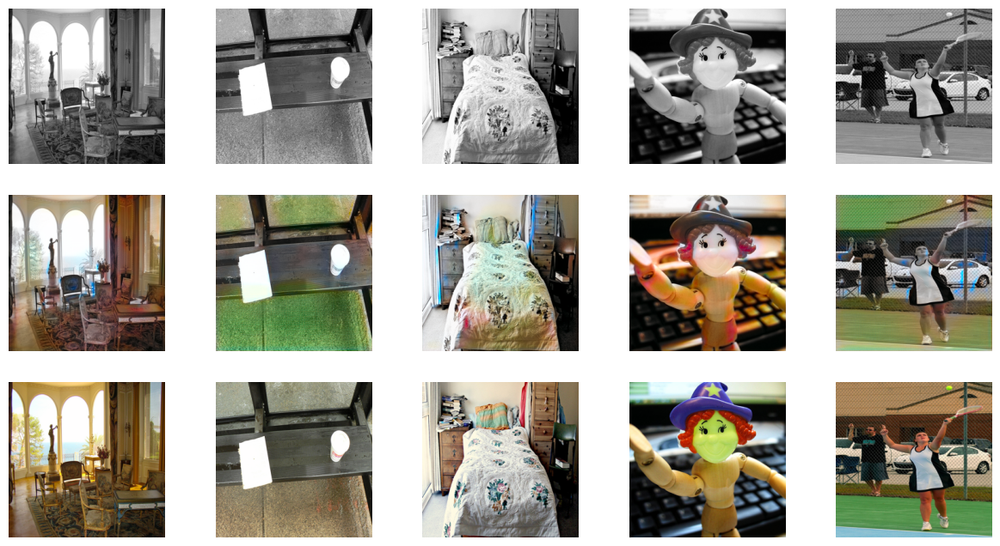


Epoch 5/5
Iteration 400/500
loss_D_fake: 0.52938
loss_D_real: 0.58318
loss_D: 0.55628
loss_G_GAN: 1.25410
loss_G_L1: 10.75793
loss_G: 12.01203


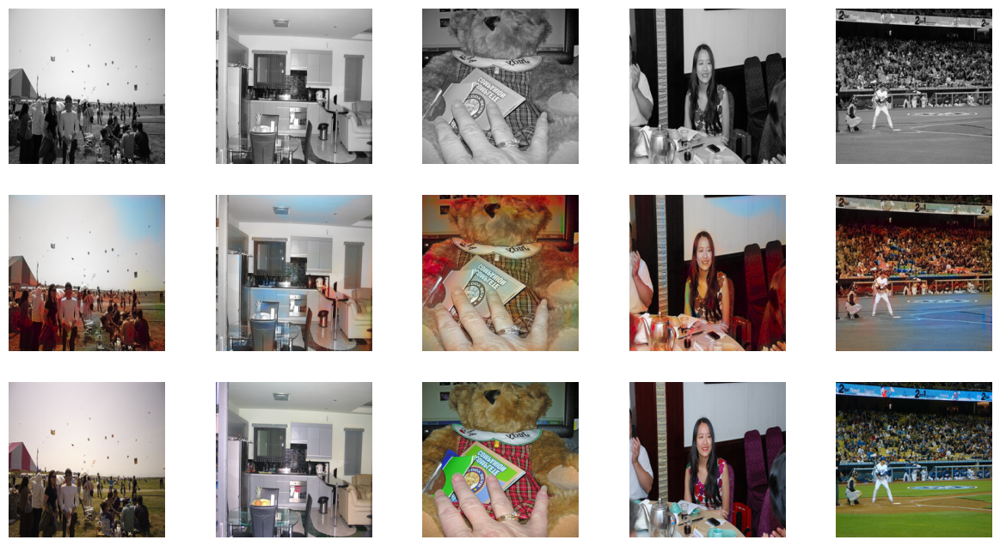

In [38]:
generator = build_backbone_unet(input_channels=1, output_channels=2, size=Config.image_size_1)
opt = optim.Adam(generator.parameters(), lr=Config.pretrain_lr)
loss = nn.L1Loss()
pretrain_generator(generator, train_dl, opt, loss, Config.epochs)
torch.save(generator.state_dict(), "res18-unet.pt")
generator.load_state_dict(torch.load("res18-unet.pt", map_location=device))
model = MainModel(net_G=generator)
train_model(model, train_dl, Config.epochs)
torch.save(model.state_dict(), "main-model.pt")

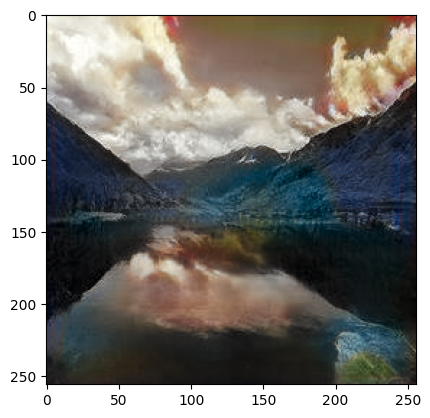

In [40]:
path = "/image_lake.png" #Replace with your path
img = PIL.Image.open(path)
img = img.resize((256, 256))
img = transforms.ToTensor()(img)[:1] * 2. - 1.
model.eval()
with torch.no_grad():
    preds = model.net_G(img.unsqueeze(0).to(device))
    gen_output = lab_to_rgb(img.unsqueeze(0), preds.cpu())[0]
# plt.imshow(img)
plt.imshow(gen_output)

In [51]:
# net_G = build_res_unet(n_input=1, n_output=2, size=256)
# net_G.load_state_dict(torch.load("res18-unet.pt", map_location=device))
# model = MainModel(net_G=net_G)
# train_model(model, train_dl, 20)

In [52]:
# !gdown --id 1lR6DcS4m5InSbZ5y59zkH2mHt_4RQ2KV

In [53]:
# modelpath = 'final_model_weights.pt'
# net_G = build_backbone_unet(input_channels=1, output_channels=2, size=256)
# net_G.load_state_dict(torch.load("res18-unet.pt", map_location=device))
# model = MainModel(net_G=net_G)
# model.load_state_dict(torch.load(modelpath, map_location=device))

# Final Comments

Of course we could train this for more epochs for better results. Building the ResNet for 2 channels for longer as well as having the discriminator and generator run for more number of epochs can surely improve results.

The following resources helped me immensely to reproduce this project. The code, concepts and nuances are fantastically explained in the below links

- https://medium.com/@harikrishnareddy19995/gans-with-memes-4233952ba151

- https://phillipi.github.io/pix2pix/
- https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix
- https://arxiv.org/pdf/1611.07004.pdf

- https://towardsdatascience.com/colorizing-black-white-images-with-u-net-and-conditional-gan-a-tutorial-81b2df111cd8
